In [1]:
sourceLabel='twitter16'

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Markdown as md

# Define the path to your text file
# file_path = './Data/twitter16/label.txt'
file_path = './Data/'+sourceLabel+'/label.txt'

# Initialize empty lists to store the data
labels = []
values = []

# Read the file line by line and extract the data
with open(file_path, 'r') as file:
    for line in file:
        line = line.strip()  # Remove any leading/trailing whitespace
        label, value = line.split(':')  # Split the line into label and value
        labels.append(label)
        values.append(int(value))  # Convert the value to an integer

# Create a DataFrame from the lists
df = pd.DataFrame({'Label': labels, 'SourceTweetID': values})

# Optionally, you can filter the DataFrame based on specific labels:
#df_filtered = df[df['Label'].isin(['true', 'false'])]
df = df[df['Label'].isin(['true', 'false'])]
df_filtered =df.copy()

df_filtered['Label'] = df['Label'].str.lower().replace({'true': True, 'false': False})

distinct_labels = df['Label'].unique()
print(distinct_labels)

# Display the DataFrame
df_filtered


['false' 'true']


,Label,SourceTweetID
0,False,656955120626880512
1,True,615689290706595840
2,False,613404935003217920
5,True,614467824313106432
9,False,622891631293935616
...,...,...
799,True,552806757672964097
801,True,544350567183556608
805,True,614593386188828672
811,True,650046859537448960


In [3]:


#df_filtered['Label']=df_filtered['Label'].astype(bool)
df_filtered_dict = df_filtered.set_index('SourceTweetID')['Label'].to_dict()
# df_filtered_dict[656955120626880512]
# bool(dict_of_lists[656955120626880512])

In [4]:
rumor_tweet_id= df_filtered['SourceTweetID'].unique()

In [5]:
import os
import pandas as pd

# Define the path to your folder containing files
# folder_path ='./Data/twitter16/tree' #'./Data/testtree'
folder_path ='./Data/'+sourceLabel+'/tree' #'./Data/testtree'

# Initialize empty lists to store the extracted data
sender_uid = []
sender_tweet_id = []
sender_post_time_delay = []
receiver_uid = []
receiver_tweet_id = []
receiver_post_time_delay = []
tweet_label=[]
counter=0
# Iterate through the files in the folder
for filename in os.listdir(folder_path):
#     counter=counter+1
#     if counter>10000:
#         break
    file_path = os.path.join(folder_path, filename)
    if int(filename.replace(".txt","")) in rumor_tweet_id: 
        #print(filename.replace(".txt","") ,' is present')
            # Open and read each file
        with open(file_path, 'r') as file:
            for line in file:
                # Split the line to extract the sender and receiver data
                sender_data, receiver_data = line.strip().split('->')

                sender_values = sender_data.strip('[]').replace("'", "").split(', ')
                receiver_values = receiver_data.strip('[]').replace("'", "").split(', ')

                if sender_values[1] ==str(filename.replace(".txt","")):
                    sender_uid.append(sender_values[0])
                    sender_tweet_id.append(sender_values[1])
                    sender_post_time_delay.append(float(sender_values[2]))

                    receiver_uid.append(receiver_values[0])
                    receiver_tweet_id.append(receiver_values[1])
                    receiver_post_time_delay.append(float(receiver_values[2]))

                    #print(int(filename.replace(".txt","")))
                    tweet_label.append(df_filtered_dict[int(filename.replace(".txt",""))])
    #else: 
        #print(filename.replace(".txt","") ,' is NOT present')
    
    


# Create a DataFrame from the extracted data
df_Joined = pd.DataFrame({
    'sender_uid': sender_uid,
    'sender_tweet_id': sender_tweet_id,
    'sender_post_time_delay': sender_post_time_delay,
    'receiver_uid': receiver_uid,
    'receiver_tweet_id': receiver_tweet_id,
    'receiver_post_time_delay': receiver_post_time_delay,
    'tweet_label':tweet_label
})
df_Joined = df_Joined[df_Joined['sender_uid'] != 'ROOT']
# Print the DataFrame
df_Joined

,sender_uid,sender_tweet_id,sender_post_time_delay,receiver_uid,receiver_tweet_id,receiver_post_time_delay,tweet_label
0,24165761,498430783699554305,0.0,33164207,498430783699554305,0.30,True
1,24165761,498430783699554305,0.0,203957378,498430783699554305,1.00,True
2,24165761,498430783699554305,0.0,475947737,498430783699554305,1.00,True
3,24165761,498430783699554305,0.0,367810627,498430783699554305,2.70,True
4,24165761,498430783699554305,0.0,144351126,498430783699554305,2.85,True
...,...,...,...,...,...,...,...
159034,972651,681767380305985536,0.0,34294546,681767380305985536,626.48,False
159035,972651,681767380305985536,0.0,19058535,681767380305985536,1644.97,False
159036,972651,681767380305985536,0.0,20732140,681767380305985536,2088.33,False
159037,972651,681767380305985536,0.0,2185248516,681767380305985536,2121.45,False


In [6]:
# df = df[df['Label'].isin(['true', 'false'])]
df_Joined=df_Joined[df_Joined['tweet_label'].isin([False])]
df_Joined

,sender_uid,sender_tweet_id,sender_post_time_delay,receiver_uid,receiver_tweet_id,receiver_post_time_delay,tweet_label
38822,2470325805,594687353937100801,0.0,1045873944,594687353937100801,1.17,False
38823,2470325805,594687353937100801,0.0,2818187993,594687353937100801,1.17,False
38824,2470325805,594687353937100801,0.0,526726554,594687353937100801,1.17,False
38825,2470325805,594687353937100801,0.0,2394981310,594687353937100801,1.17,False
38826,2470325805,594687353937100801,0.0,755803914,594687353937100801,4.85,False
...,...,...,...,...,...,...,...
159034,972651,681767380305985536,0.0,34294546,681767380305985536,626.48,False
159035,972651,681767380305985536,0.0,19058535,681767380305985536,1644.97,False
159036,972651,681767380305985536,0.0,20732140,681767380305985536,2088.33,False
159037,972651,681767380305985536,0.0,2185248516,681767380305985536,2121.45,False


In [7]:
# Remove rows where sender_uid and receiver_uid are the same
df_Joined = df_Joined[df_Joined['sender_uid'] != df_Joined['receiver_uid']] 
df_Joined

,sender_uid,sender_tweet_id,sender_post_time_delay,receiver_uid,receiver_tweet_id,receiver_post_time_delay,tweet_label
38822,2470325805,594687353937100801,0.0,1045873944,594687353937100801,1.17,False
38823,2470325805,594687353937100801,0.0,2818187993,594687353937100801,1.17,False
38824,2470325805,594687353937100801,0.0,526726554,594687353937100801,1.17,False
38825,2470325805,594687353937100801,0.0,2394981310,594687353937100801,1.17,False
38826,2470325805,594687353937100801,0.0,755803914,594687353937100801,4.85,False
...,...,...,...,...,...,...,...
159034,972651,681767380305985536,0.0,34294546,681767380305985536,626.48,False
159035,972651,681767380305985536,0.0,19058535,681767380305985536,1644.97,False
159036,972651,681767380305985536,0.0,20732140,681767380305985536,2088.33,False
159037,972651,681767380305985536,0.0,2185248516,681767380305985536,2121.45,False


In [8]:
df_Joined = df_Joined[['sender_uid', 'receiver_uid']].drop_duplicates()
df_Joined

,sender_uid,receiver_uid
38822,2470325805,1045873944
38823,2470325805,2818187993
38824,2470325805,526726554
38825,2470325805,2394981310
38826,2470325805,755803914
...,...,...
159034,972651,34294546
159035,972651,19058535
159036,972651,20732140
159037,972651,2185248516


In [9]:
import networkx as nx
G=nx.DiGraph()
for index, row in df_Joined.iterrows():
    user_author=row['sender_uid']
    user_retweet=row['receiver_uid']
    G.add_edge(user_author,user_retweet)
    

# Reversing the edge direction helps source with higher Eigen Value

In [10]:
G= G.reverse(copy=True) 

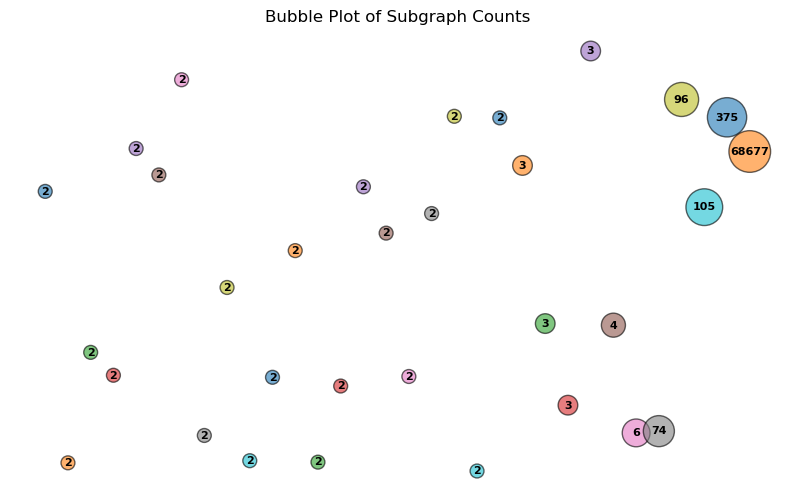

In [11]:
import random
import numpy as np

# Find weakly connected components (subgraphs)
subgraphs = list(nx.weakly_connected_components(G))

# Get number of nodes in each subgraph
subgraph_sizes = [len(subgraph) for subgraph in subgraphs]


# Normalize bubble sizes for stepwise increase in radius
unique_sizes = sorted(set(subgraph_sizes))
size_mapping = {size: i + 1 for i, size in enumerate(unique_sizes)}
scaled_sizes = [size_mapping[size] * 100 for size in subgraph_sizes]  # Scale for visibility

# Sort data by ascending subgraph size
sorted_indices = np.argsort(subgraph_sizes)
sorted_sizes = np.array(subgraph_sizes)[sorted_indices]
sorted_bubble_sizes = np.array(scaled_sizes)[sorted_indices]

# Generate random y positions
random.seed(42)
y_positions = [random.uniform(0.5, 1.5) for _ in range(len(sorted_sizes))]

# Generate random colors for each bubble
colors = [plt.cm.get_cmap("tab10")(i % 10) for i in range(len(sorted_sizes))]

# Create bubble plot based only on count, without x and y axes
plt.figure(figsize=(10, 6))

# Create scatter plot with different colors for each circle
plt.scatter(range(len(sorted_sizes)), y_positions, s=sorted_bubble_sizes, color=colors, alpha=0.6, edgecolors="black")

# Add labels with values inside bubbles
for i, size in enumerate(sorted_sizes):
    plt.text(i, y_positions[i], str(size), fontsize=8, ha='center', va='center', color='black', weight='bold')

# Remove x and y axes completely
plt.axis('off')

# Set title
plt.title("Bubble Plot of Subgraph Counts")

# Display the plot
plt.show()

In [12]:
# eigenvector=nx.out_degree_centrality(G) #nx.eigenvector_centrality_numpy(G)
# eigenvector=nx.in_degree_centrality(G) #nx.eigenvector_centrality_numpy(G)
Degree=nx.degree_centrality(G) #nx.eigenvector_centrality_numpy(G)



In [13]:
Degree_df = pd.DataFrame(Degree.items(), columns=['User', 'Degree_Centrality'])


In [14]:
Degree_df = Degree_df.sort_values(by='Degree_Centrality', ascending=False)


In [15]:
Degree_df 

,User,Degree_Centrality
8298,343051698,0.032872
6824,13049362,0.030840
11383,759251,0.030379
13670,5695632,0.029803
35450,434655422,0.028059
...,...,...
25765,519322636,0.000014
25767,266933227,0.000014
25768,1274469050,0.000014
25769,1255956230,0.000014


In [16]:
Degree_df.iloc[0]['Degree_Centrality']

0.03287217178267762

In [17]:
target_user=Degree_df.iloc[0]['User']

In [18]:
# pagerank = nx.pagerank(G, alpha=0.85)


In [19]:
# Combine scores into a DataFrame
centrality_df = pd.DataFrame({'User': list(G.nodes()), 
                              'Degree_Centrality': [Degree.get(node, 0) for node in G.nodes()] })

In [20]:
# Normalize scores (Min-Max Scaling)
centrality_df['Degree_Centrality'] = (centrality_df['Degree_Centrality'] - centrality_df['Degree_Centrality'].min()) / \
                                          (centrality_df['Degree_Centrality'].max() - centrality_df['Degree_Centrality'].min())


In [22]:
# Sort and display top misinformation spreaders
centrality_df = centrality_df.sort_values(by='Degree_Centrality', ascending=False)

In [23]:
centrality_df

,User,Degree_Centrality
8298,343051698,1.000000
6824,13049362,0.938158
11383,759251,0.924123
13670,5695632,0.906579
35450,434655422,0.853509
...,...,...
25765,519322636,0.000000
25767,266933227,0.000000
25768,1274469050,0.000000
25769,1255956230,0.000000


In [24]:
import plotly.express as px

centrality_df['Size_Log'] = np.log1p(centrality_df['Degree_Centrality']) * 50  # Log scale to handle large values
sample_df = centrality_df.sample(n=69391 , random_state=42)  # Adjust sample size as needed

# Reset index to remove it from hover tooltip
sample_df = sample_df.reset_index(drop=True)  # Ensures index is not included in hover data

# Create interactive scatter plot
fig = px.scatter(sample_df, 
                 x=sample_df.index, y="Degree_Centrality",  # X-axis uses index for spacing but won’t show in hover
                 size="Size_Log", color="Degree_Centrality",
                 hover_name="User",  # Show user on hover
                 hover_data={"Degree_Centrality": True, "Size_Log": False},  # Hide size info
                 title="Interactive Bubble Plot: Users vs Degree Centrality")

# Use hovertemplate to completely remove index from tooltip
fig.update_traces(hovertemplate="<b>User:</b> %{hovertext}<br><b>Degree Centrality Score:</b> %{y}")

# Update layout for better visualization
fig.update_layout(xaxis_title="User Index", 
                  yaxis_title="Degree Centrality Score",
                  template="plotly_white")  # Cleaner background

fig.show()


# Setting the Threshold 

In [25]:
centrality_df.head(20)

,User,Degree_Centrality,Size_Log
8298,343051698,1.000000,34.657359
6824,13049362,0.938158,33.086899
11383,759251,0.924123,32.723509
13670,5695632,0.906579,32.265525
35450,434655422,0.853509,30.854024
40399,28785486,0.779386,28.813417
30624,2425231,0.745175,27.842754
64799,126903716,0.708333,26.775912
5044,14075928,0.702632,26.608752
20023,3369234799,0.668860,25.607027


# Displaying the connection of the super spreader with highest Combined_Score

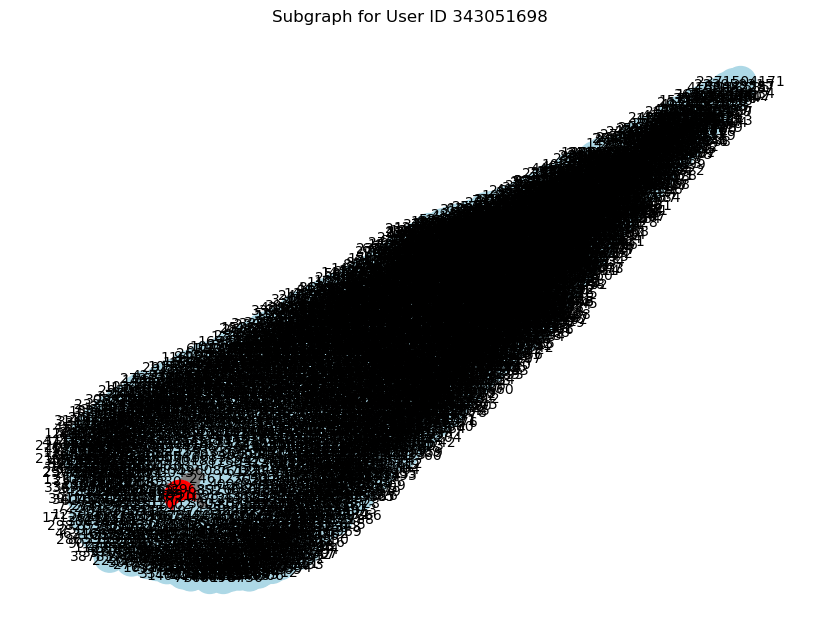

In [26]:
import networkx as nx
import matplotlib.pyplot as plt
# Create a subgraph containing only edges where the target user is involved
filtered_edges = [(u, v) for u, v in G.edges if u == target_user or v == target_user]

# Create a new subgraph from these edges
G_sub = G.edge_subgraph(filtered_edges).copy()

# Draw the subgraph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G_sub, seed=42)  # Layout for better visualization

# Assign colors: target user in red, others in light blue
node_colors = ['red' if node == target_user else 'lightblue' for node in G_sub.nodes]

nx.draw(G_sub, pos, with_labels=True, node_size=500, node_color=node_colors, edge_color='gray', font_size=10)

plt.title(f"Subgraph for User ID {target_user}")
plt.show()

In [27]:
len(filtered_edges)

2281

In [28]:
# Define the node to remove
# target_user = "2980186012"
print("Number of Nodes In Grapgh Before Delete: ",  G.number_of_nodes())
# Create a copy of the graph (to avoid modifying the original)
G_filtered = G.copy()

# Remove the target node
if target_user in G_filtered:
    print('Deleted')
    G_filtered.remove_node(target_user)

Number of Nodes In Grapgh Before Delete:  69391
Deleted


In [29]:
# Find weakly connected components (subgraphs)
subgraphs = list(nx.weakly_connected_components(G_filtered))

# Get number of nodes in each subgraph
subgraph_sizes = [len(subgraph) for subgraph in subgraphs]

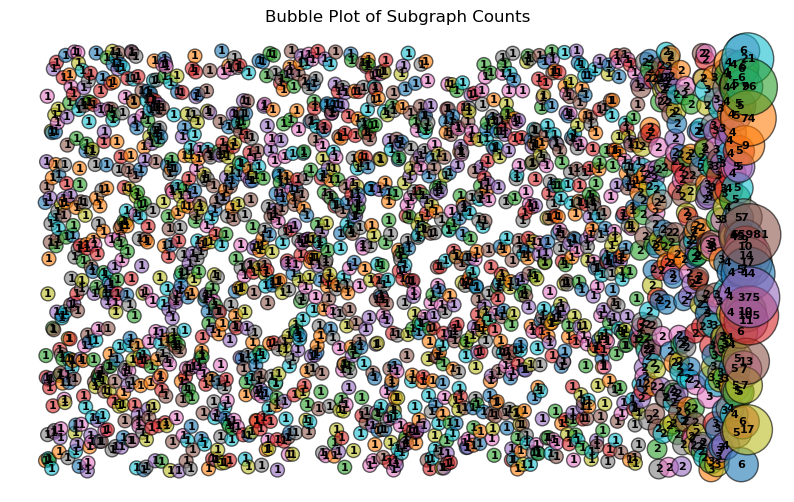

In [30]:
import random
# Normalize bubble sizes for stepwise increase in radius
unique_sizes = sorted(set(subgraph_sizes))
size_mapping = {size: i + 1 for i, size in enumerate(unique_sizes)}
scaled_sizes = [size_mapping[size] * 100 for size in subgraph_sizes]  # Scale for visibility

# Sort data by ascending subgraph size
sorted_indices = np.argsort(subgraph_sizes)
sorted_sizes = np.array(subgraph_sizes)[sorted_indices]
sorted_bubble_sizes = np.array(scaled_sizes)[sorted_indices]

# Generate random y positions
random.seed(42)
y_positions = [random.uniform(0.5, 1.5) for _ in range(len(sorted_sizes))]

# Generate random colors for each bubble
colors = [plt.cm.get_cmap("tab10")(i % 10) for i in range(len(sorted_sizes))]

# Create bubble plot based only on count, without x and y axes
plt.figure(figsize=(10, 6))

# Create scatter plot with different colors for each circle
plt.scatter(range(len(sorted_sizes)), y_positions, s=sorted_bubble_sizes, color=colors, alpha=0.6, edgecolors="black")

# Add labels with values inside bubbles
for i, size in enumerate(sorted_sizes):
    plt.text(i, y_positions[i], str(size), fontsize=8, ha='center', va='center', color='black', weight='bold')

# Remove x and y axes completely
plt.axis('off')

# Set title
plt.title("Bubble Plot of Subgraph Counts")

# Display the plot
plt.show()

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import random
import networkx as nx

# Extract the largest subgraph in G1 and G2
largest_subgraph_G1 = max(nx.weakly_connected_components(G), key=len)
largest_subgraph_G2 = max(nx.weakly_connected_components(G_filtered), key=len)


# Find all subgraphs in G1 and G2
subgraphs_G1 = sorted([comp for comp in nx.weakly_connected_components(G)], key=len, reverse=True)
subgraphs_G2 = sorted([comp for comp in nx.weakly_connected_components(G_filtered)], key=len, reverse=True)

 
# Get the sizes of the largest subgraphs
size_G1 = len(largest_subgraph_G1)
size_G2 = len(largest_subgraph_G2)

# Compute the difference in subgraph sizes
size_difference = abs(size_G1 - size_G2)

# Display the comparison results
print("Comparison of Largest Subgraphs:")
print(f"Largest Subgraph in G1: {size_G1} nodes")
print(f"Largest Subgraph in G2: {size_G2} nodes")
print(f"Difference in node count: {size_difference} nodes")


Comparison of Largest Subgraphs:
Largest Subgraph in G1: 68677 nodes
Largest Subgraph in G2: 65981 nodes
Difference in node count: 2696 nodes


In [32]:
import networkx as nx

# Extract the largest subgraphs in G1 and G2
largest_subgraph_G1 = max(nx.weakly_connected_components(G), key=len)
largest_subgraph_G2 = max(nx.weakly_connected_components(G_filtered), key=len)

# Get the sizes of the largest subgraphs
size_G1 = len(largest_subgraph_G1)
size_G2 = len(largest_subgraph_G2)

# Compute the difference in subgraph sizes
size_difference = abs(size_G1 - size_G2)

# Find all subgraphs in G1 and G2
subgraphs_G1 = sorted([comp for comp in nx.weakly_connected_components(G)], key=len, reverse=True)
subgraphs_G2 = sorted([comp for comp in nx.weakly_connected_components(G_filtered)], key=len, reverse=True)

# Count the number of subgraphs in G1 and G2
num_subgraphs_G1 = len(subgraphs_G1)
num_subgraphs_G2 = len(subgraphs_G2)

# Find the removed node
removed_node = list(set(largest_subgraph_G1) - set(largest_subgraph_G2))[0]

# Identify which subgraphs in G2 contain the removed node
subgraphs_containing_removed_node = [i+1 for i, sub in enumerate(subgraphs_G2) if removed_node in sub]

# Display the comparison results
print("Comparison of Largest Subgraphs:")
print(f"Largest Subgraph in G1: {size_G1} nodes")
print(f"Largest Subgraph in G2: {size_G2} nodes")
print(f"Difference in node count: {size_difference} nodes")
print(f"Number of subgraphs in G1: {num_subgraphs_G1}")
print(f"Number of subgraphs in G2: {num_subgraphs_G2}")
print(f"Removed Node: {removed_node}")
print(f"Subgraphs in G2 containing the removed node: {subgraphs_containing_removed_node}")

Comparison of Largest Subgraphs:
Largest Subgraph in G1: 68677 nodes
Largest Subgraph in G2: 65981 nodes
Difference in node count: 2696 nodes
Number of subgraphs in G1: 32
Number of subgraphs in G2: 2076
Removed Node: 574711568
Subgraphs in G2 containing the removed node: [1571]


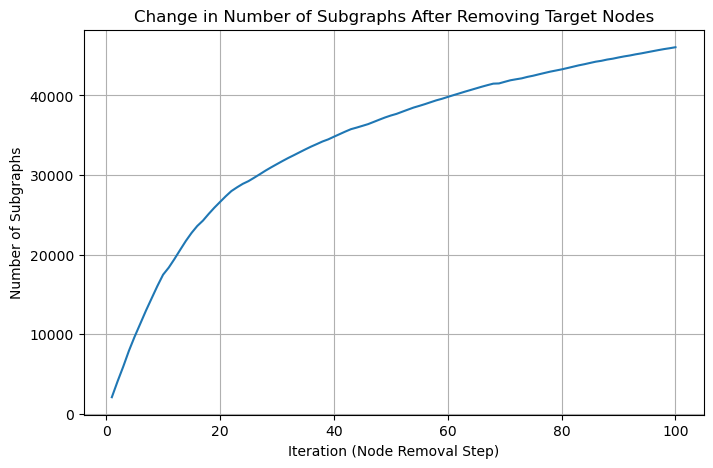

In [33]:


# Create a copy of the graph (to avoid modifying the original)
G_filtered = G.copy()

# Store number of subgraphs after each node removal
subgraph_counts = []

# Iterate through target nodes and remove them one by one
for target_node in centrality_df[:100]['User']:
    if target_node in G_filtered:
        G_filtered.remove_node(target_node)
        num_subgraphs = nx.number_weakly_connected_components(G_filtered)  # Corrected line
        subgraph_counts.append(num_subgraphs)
        #print(f"Deleted Node {target_node}, Number of Subgraphs: {num_subgraphs}")

# Line plot of the number of subgraphs after each node removal
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(subgraph_counts) + 1), subgraph_counts,   linestyle='-')
plt.xlabel("Iteration (Node Removal Step)")
plt.ylabel("Number of Subgraphs")
plt.title("Change in Number of Subgraphs After Removing Target Nodes")
plt.grid(True)
plt.show()